<a name="TOC"></a>
# Dynamics Tutorial 5: FSSH vs. DISH (and mSDM)

In this tutorial we will learn:

* how to incorporate decoherence correction via DISH
* the qualitative difference in results of DISH with the FSSH and mSDM calculations
* how use different types of dephasing rates
* how to control the details of the wavefunction collapse and how it may affect the results

Note:
  DISH - decoherence-induced surface hopping

TOC:

1. [Define models](#define_models)
2. [Plotting](#plotting)

 2.1. [Plotting PES/properties](#pes_plot)


3. [PES scan](#pes_scan)

 3.1. [Diabatic PES scan](#pes_scan-1)
 
 3.2. [Numeric Adiabatic PES scan](#pes_scan-2)
 
 3.3. [Analytic Adiabatic PES scan](#pes_scan-3)


4. [Dynamics](#dynamics)

 4.1. [FSSH](#fssh)
 
 4.2. [DISH + user-supplied dephasing](#dish-1)
 
 4.3. [DISH + EDC dephasing](#dish-2)
 
 4.4. [mSDM + user-supplied dephasing](#msdm)
 

In [1]:
import sys
import cmath
import math
import os
import matplotlib.pyplot as plt   # plots
import numpy as np
#from matplotlib.mlab import griddata
%matplotlib inline 


if sys.platform=="cygwin":
    from cyglibra_core import *
elif sys.platform=="linux" or sys.platform=="linux2":
    from liblibra_core import *
import util.libutil as comn

from libra_py import units
from libra_py.models import Tully
from libra_py.models import Holstein
from libra_py import tsh
from libra_py import tsh_stat
import libra_py.dynamics.tsh.compute as compute
import libra_py.dynamics.tsh.plot as dynamics_plotting
from libra_py import data_conv


plt.rc('axes', titlesize=24)      # fontsize of the axes title
plt.rc('axes', labelsize=20)      # fontsize of the x and y labels
plt.rc('legend', fontsize=20)     # legend fontsize
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels

plt.rc('figure.subplot', left=0.2)
plt.rc('figure.subplot', right=0.95)
plt.rc('figure.subplot', bottom=0.13)
plt.rc('figure.subplot', top=0.88)

colors = {}

colors.update({"11": "#8b1a0e"})  # red       
colors.update({"12": "#FF4500"})  # orangered 
colors.update({"13": "#B22222"})  # firebrick 
colors.update({"14": "#DC143C"})  # crimson   

colors.update({"21": "#5e9c36"})  # green
colors.update({"22": "#006400"})  # darkgreen  
colors.update({"23": "#228B22"})  # forestgreen
colors.update({"24": "#808000"})  # olive      

colors.update({"31": "#8A2BE2"})  # blueviolet
colors.update({"32": "#00008B"})  # darkblue  

colors.update({"41": "#2F4F4F"})  # darkslategray

clrs_index = ["11", "21", "31", "41", "12", "22", "32", "13","23", "14", "24"]

/home/alexey/miniconda2/envs/py37/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: to-Python converter for std::vector<std::complex<double>, std::allocator<std::complex<double> > > already registered; second conversion method ignored.
  return f(*args, **kwds)
/home/alexey/miniconda2/envs/py37/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: to-Python converter for std::vector<std::vector<int, std::allocator<int> >, std::allocator<std::vector<int, std::allocator<int> > > > already registered; second conversion method ignored.
  return f(*args, **kwds)
/home/alexey/miniconda2/envs/py37/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: to-Python converter for boost::python::detail::container_element<std::vector<std::vector<int, std::allocator<int> >, std::allocator<std::vector<int, std::allocator<int> > > >, unsigned long, boost::python::detail::final_vector_derived_policies<std::vector<std::vector<int, std::allocator<int> >, std::allocator<std::vector<int, s

<a name="define_models"></a>
[Back to TOC](#TOC)

## 1. Define the models

First, lets defined the model Hamiltonians in the diabatic and diabatic representation. This part has been covered in the previous tutorials. 

As before, we use a 2-state spin-boson Hamiltonian, which can be written in adiabatic representation analytically. 

In [2]:
class tmp:
    pass

def my_test_dia_abstract(q, params, full_id):
    """
   
    2-state spin-boson model [Ref: Subotnik, JCP 135, 191101, 2011]

         | 0.5*m*w^2*x^2 + M*x          V                    |
    H =  |                                                   |
         |       V               0.5*m*w^2*x^2 - M*x - eps   |
         

    M = sqrt(E_r * m * w^2 / 2)
    

    Args: 
        q ( MATRIX(1,1) ): coordinates of the particle, ndof = 1
        params ( dictionary ): model parameters

            * **params["omega"]** ( double ):  [ units: a.u. ]
            * **params["E_r"]**   ( double ):  [ units: Ha ]
            * **params["mass"]** ( double ):  [ units: a.u. ]
            * **params["V"]**   ( double ):  [ units: Ha ]
            * **params["epsilon"]**   ( double ):  [ units: Ha ]

    Returns:       
        PyObject: obj, with the members:

            * obj.ham_dia ( CMATRIX(n,n) ): diabatic Hamiltonian 
            * obj.ovlp_dia ( CMATRIX(n,n) ): overlap of the basis (diabatic) states [ identity ]
            * obj.d1ham_dia ( list of 1 CMATRIX(n, n) objects ): 
                derivatives of the diabatic Hamiltonian w.r.t. the nuclear coordinate
            * obj.dc1_dia ( list of 1 CMATRIX(n, n) objects ): derivative coupling in the diabatic basis [ zero ]
 
    """


    critical_params = [] 
    default_params = { "omega":3.5e-4, "E_r":2.39e-2, "mass":1.0, "V":1.49e-5, "epsilon":1.5e-2  }
    comn.check_input(params, default_params, critical_params)

    omega = params["omega"]
    E_r = params["E_r"]
    mass = params["mass"]
    V = params["V"]
    epsilon = params["epsilon"]
    
    n = 2

    Hdia = CMATRIX(n,n)
    Sdia = CMATRIX(n,n)
    d1ham_dia = CMATRIXList();  d1ham_dia.append( CMATRIX(n,n) )
    dc1_dia = CMATRIXList();  dc1_dia.append( CMATRIX(n,n) )
  
    Id = Cpp2Py(full_id)
    indx = Id[-1]

    x = q.col(indx).get(0)
    
    Sdia.identity()    
    
    M = omega * math.sqrt(0.5*E_r * mass)
    
    Hdia.set(0,0,  (0.5*mass*omega*omega*x*x + M *x )  * (1.0+0.0j) )
    Hdia.set(1,1,  (0.5*mass*omega*omega*x*x - M *x - epsilon )  * (1.0+0.0j) )
    Hdia.set(0,1,  V  * (1.0+0.0j) )
    Hdia.set(1,0,  V  * (1.0+0.0j) )
            
    d1ham_dia[0].set(0, 0, (omega*omega*x + M)*(1.0+0.0j) )    
    d1ham_dia[0].set(1, 1, (omega*omega*x - M)*(1.0+0.0j) )    
    d1ham_dia[0].set(0, 1, (0.0+0.0j) )    
    d1ham_dia[0].set(1, 0, (0.0+0.0j) )    
            
                    
    obj = tmp()
    obj.ham_dia = Hdia
    obj.ovlp_dia = Sdia
    obj.d1ham_dia = d1ham_dia
    obj.dc1_dia = dc1_dia

    return obj


def my_test_adi_abstract(q, params, full_id):
    """
   
    2-state spin-boson model [Ref: Subotnik, JCP 135, 191101, 2011]

         | 0.5*m*w^2*x^2 - eps/2 - sqrt( (eps/2 + M*x)^2 + V^2 )          d12 * i          |
    H =  |                                                                                 | 
         |       -d12 * i      0.5*m*w^2*x^2 - eps/2 - sqrt( (eps/2 + M*x)^2 + V^2 )       |
         

    M = sqrt(E_r * m * w^2 / 2)
    
    d12 = 0.5 * M * V / [ (eps/2 +  M*x)^2 + V^2 ]
    

    Args: 
        q ( MATRIX(1,1) ): coordinates of the particle, ndof = 1
        params ( dictionary ): model parameters

            * **params["omega"]** ( double ):  [ units: a.u. ]
            * **params["E_r"]**   ( double ):  [ units: Ha ]
            * **params["mass"]** ( double ):  [ units: a.u. ]
            * **params["V"]**   ( double ):  [ units: Ha ]
            * **params["epsilon"]**   ( double ):  [ units: Ha ]

    Returns:       
        PyObject: obj, with the members:

            * obj.ham_dia ( CMATRIX(n,n) ): diabatic Hamiltonian 
            * obj.ovlp_dia ( CMATRIX(n,n) ): overlap of the basis (diabatic) states [ identity ]
            * obj.d1ham_dia ( list of 1 CMATRIX(n, n) objects ): 
                derivatives of the diabatic Hamiltonian w.r.t. the nuclear coordinate
            * obj.dc1_dia ( list of 1 CMATRIX(n, n) objects ): derivative coupling in the diabatic basis [ zero ]
    """


    critical_params = [] 
    default_params = { "omega":3.5e-4, "E_r":2.39e-2, "mass":1.0, "V":1.49e-5, "epsilon":1.5e-2  }
    comn.check_input(params, default_params, critical_params)

    omega = params["omega"]
    E_r = params["E_r"]
    mass = params["mass"]
    V = params["V"]
    epsilon = params["epsilon"]
    
    n = 2

    Hadi = CMATRIX(n,n)
    d1ham_adi = CMATRIXList();  d1ham_adi.append( CMATRIX(n,n) )
    dc1_adi = CMATRIXList();  dc1_adi.append( CMATRIX(n,n) )
  
    Id = Cpp2Py(full_id)
    indx = Id[-1]

    x = q.col(indx).get(0)

    
    M = omega * math.sqrt(0.5*E_r * mass)
    
    t = (epsilon/2.0 +  M*x)**2 + V * V 
    tsq = math.sqrt(t)
    dtsq = M * (epsilon/2.0 + M*x)/tsq   # d [tsq]/dx
    d = 0.5*M*V/t
        
    
    Hadi.set(0,0,  (0.5*mass*omega*omega*x*x - 0.5*epsilon - tsq) * (1.0+0.0j) )
    Hadi.set(1,1,  (0.5*mass*omega*omega*x*x - 0.5*epsilon + tsq) * (1.0+0.0j) )
    Hadi.set(0,1,  (0.0+0.0j) )
    Hadi.set(1,0,  (0.0+0.0j) )
            
    d1ham_adi[0].set(0, 0, (omega*omega*x - dtsq )*(1.0+0.0j) )    
    d1ham_adi[0].set(1, 1, (omega*omega*x + dtsq )*(1.0+0.0j) )    
    d1ham_adi[0].set(0, 1, (0.0+0.0j) )    
    d1ham_adi[0].set(1, 0, (0.0+0.0j) )    
    
    dc1_adi[0].set(0, 1, d*(1.0+0.0j) )    
    dc1_adi[0].set(1, 0, d*(-1.0+0.0j) )    
    dc1_adi[0].set(0, 0, (0.0+0.0j) )    
    dc1_adi[0].set(1, 1, (0.0+0.0j) )    
            
                    
    obj = tmp()
    obj.ham_adi = Hadi    
    obj.d1ham_adi = d1ham_adi
    obj.dc1_adi = dc1_adi

    return obj




In addition, in this tutorial we define yet another version of the Hamiltonian setup function **my_test_adi_files** which really just reads the existing files (with vibronic Hamiltonians) and returns the object that contains the **hvib_adi** member with such matrices. This function is meant to be used with the NBRA-type calculations, when the (vibronic) Hamiltonians are already pre-computed for the entire trajectories and do not affect the nuclear dynamics. This is why we don't really need anything other than the vibronic Hamiltonians. 

Unlike in the previous setups, the **params** variable is now expected to contain two keys:

* **prefix** - indicates the common part of the files to read (e.g. including the path to those files). The files should contain the vibronic Hamiltonian matrices in a particular format. The format can be changed together with the corresponding code to read it in. 

* **timestep** - the index of the filename to read. This index should correspond to the integration timestep. This parameter is changed in the **dynamics.run_dynamics** function before the call of this Hamiltonian evaluation is made. This way, one can read the files for particular timesteps.

The format of the files to read is expected to be "{prefix}{indx}.txt", so it could be that we'd read the files named:
"res/Ham_0.txt", "res/Ham_1.txt", "res/Ham_2.txt", ... "res/Ham_1000.txt" 



In [3]:
def my_test_adi_files(q, params, full_id):
    """
   
    Read in the vibronic Hamiltonians along the trajectories
    
    Args: 
        q ( MATRIX(1,1) ): coordinates of the particle, ndof = 1, but they do not really affect anything
        params ( dictionary ): model parameters

            * **params["timestep"]** ( int ):  [ index of the file to read ]
            * **params["prefix"]**   ( string ):  [ the prefix of the file to read ]
        

    Returns:       
        PyObject: obj, with the members:

            * obj.hvib_adi ( CMATRIX(n,n) ): adiabatic vibronic Hamiltonian 
            
    """
    
    n = 2

    H_vib_adi = CMATRIX(n,n)    
  
    Id = Cpp2Py(full_id)
    indx = Id[-1]    
    timestep = params["timestep"]
    prefix = params["prefix"]
        
    f = open(F"{prefix}{indx}.txt", "r")
    A = f.readlines()
    f.close()
    
    h = A[timestep].split()    
    
    for a in range(n):
        for b in range(n):
            re = float(h[1 + (a*n+b)*2+0])
            im = float(h[1 + (a*n+b)*2+1])
            
            H_vib_adi.set(a, b, re+im*1j)
    
                                    
    obj = tmp()
    obj.hvib_adi = H_vib_adi    
    

    return obj

The call of the file-based Hamiltonian "calculation" function will be made when we select the **model**  parameter to take the value of 3

In [4]:
def compute_model(q, params, full_id):

    model = params["model"]
    res = None
    
    if model==1:
        res = my_test_dia_abstract(q, params, full_id)
    elif model==2:
        res = my_test_adi_abstract(q, params, full_id)
    elif model==3: 
        res = my_test_adi_files(q, params, full_id)        

    return res


<a name="plotting"></a>
[Back to TOC](#TOC)

## 2. Plotting functions


<a name="pes_plot"></a>
[Back to TOC](#TOC)
### 2.1. Plotting PES/properties

In [5]:
def plot_properties(grid, comp_model, model_params, dyn_params):

    ndia, nadi, ndof = 2, 2, 1
    
    rep_tdse = dyn_params["rep_tdse"]  # what we want

    # ======= Hierarchy of Hamiltonians =======
    tol = 0.01
    ham = nHamiltonian(ndia, nadi, ndof)
    ham.init_all(2)
    ham.phase_corr_ovlp_tol = tol

    ham1 = [] 
    for tr in range(1):
        ham1.append( nHamiltonian(ndia, nadi, ndof) )        
        ham1[tr].init_all(2)
        ham1[tr].phase_corr_ovlp_tol = tol
        ham.add_child(ham1[tr])
        
    projectors = CMATRIXList()
    for tr in range(1):
        projectors.append(CMATRIX(nadi, nadi))
        projectors[tr].identity()   

    # Energies, forces, and couplings    
    H00, H11, H01 = [], [], []
    dH00, dH11, dH01 = [], [], []
    d01 = []
    
    nsteps = len(grid)
    
    tid = Py2Cpp_int([0, 0])
    
    for i in range(nsteps):
        q = MATRIX(1,1); q.set(0, 0, grid[i])
            
        update_Hamiltonian_q(dyn_params, q, projectors, ham, compute_model, model_params)
        
        if rep_tdse==0:    
            H00.append(ham.get_ham_dia(tid).get(0,0).real)
            H11.append(ham.get_ham_dia(tid).get(1,1).real)
            H01.append(ham.get_ham_dia(tid).get(0,1).real)    
    
            
            dH00.append(ham.get_d1ham_dia(0,tid).get(0,0).real)
            dH11.append(ham.get_d1ham_dia(0,tid).get(1,1).real)            
            dH01.append(ham.get_d1ham_dia(0,tid).get(0,1).real) 
            
            d01.append(ham.get_dc1_dia(0,tid).get(0,1).real)
            
        elif rep_tdse==1:    
            H00.append(ham.get_ham_adi(tid).get(0,0).real)
            H11.append(ham.get_ham_adi(tid).get(1,1).real)
            H01.append(ham.get_ham_adi(tid).get(0,1).real)    
    
            dH00.append(ham.get_d1ham_adi(0,tid).get(0,0).real)
            dH11.append(ham.get_d1ham_adi(0,tid).get(1,1).real)            
            dH01.append(ham.get_d1ham_adi(0,tid).get(0,1).real) 
            
            d01.append(ham.get_dc1_adi(0,tid).get(0,1).real)            
            
            
    #======== Now lets plot what we have computed ===========
    plt.figure(1, figsize=(24, 12)) # dpi=300, frameon=False)
    plt.subplot(1,3,1)
    plt.title('Energies and couplings')
    plt.xlabel('Coordinate, a.u.')
    plt.ylabel('Energy, a.u.')
    plt.plot(grid, H00, label='H00', linewidth=2, color = colors["11"]) 
    plt.plot(grid, H11, label='H11', linewidth=2, color = colors["21"]) 
    plt.plot(grid, H01, label='H01', linewidth=2, color = colors["31"]) 
    plt.legend()

    plt.subplot(1,3,2)
    plt.title('Derivatives')
    plt.xlabel('Coordinate, a.u.')
    plt.ylabel('Energy, a.u./Bohr')
    plt.plot(grid, dH00, label='dH00', linewidth=2, color = colors["11"]) 
    plt.plot(grid, dH11, label='dH11', linewidth=2, color = colors["21"]) 
    plt.plot(grid, dH01, label='dH01', linewidth=2, color = colors["31"]) 
    plt.legend()
    
    plt.subplot(1,3,3)
    plt.title('Derivative couplings')
    plt.xlabel('Coordinate, a.u.')
    plt.ylabel('Energy, a.u./Bohr')
    plt.plot(grid, d01, label='d01', linewidth=2, color = colors["31"]) 
    plt.legend()

    plt.show()
    plt.close()

<a name="pes_scan"></a>
[Back to TOC](#TOC)

## 3. PES scan

Define the grid

In [6]:
xmin = -500.0
xmax = 300.0
dx = 1.0

X = []
nsteps = int((xmax - xmin) / dx) + 1

for i in range(nsteps):
    X.append(xmin + i * dx)

Now, let plot the PES in 3 ways:

<a name="pes_scan-1"></a>
[Back to TOC](#TOC)

### 3.1. Option 1: Diabatic properties

We want diabatic properties and the model Hamiltonian does return the diabatic properties

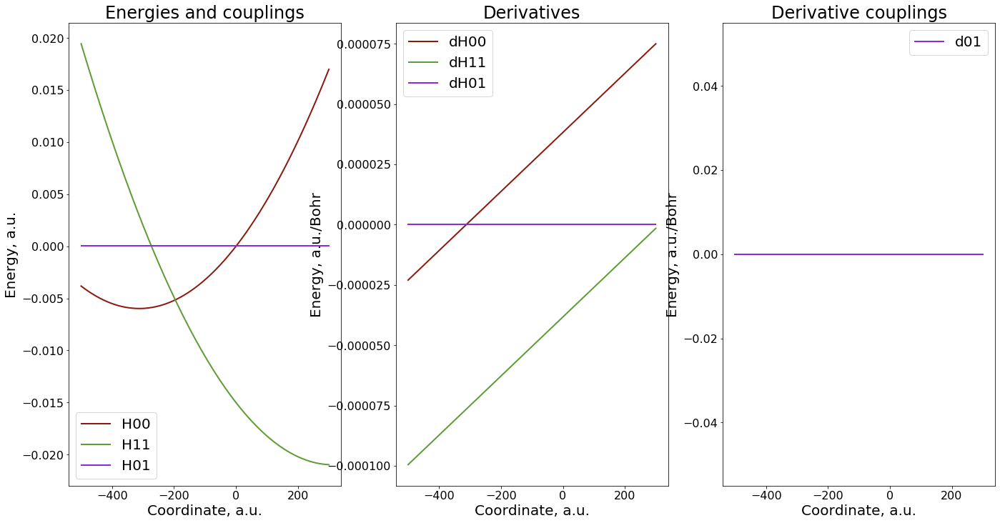

In [7]:
plot_properties(X, compute_model, {"model":1}, {"rep_tdse":0, "rep_ham":0} )

<a name="pes_scan-2"></a>
[Back to TOC](#TOC)

### 3.2. Option 2: Adiabatic properties via numerical adiabatization
Now, we want adiabatic properties but the model returns only the diabatic properties, so the needed calculations will be done under the hood

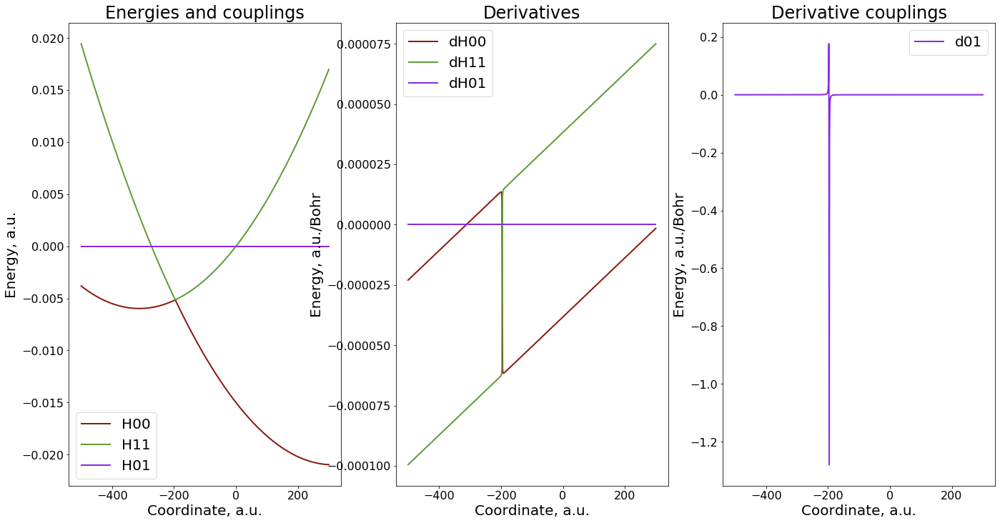

In [8]:
plot_properties(X, compute_model, {"model":1}, {"rep_tdse":1, "rep_ham":0} )

<a name="pes_scan-3"></a>
[Back to TOC](#TOC)

### 3.3. Option 3: Analytic Adiabatic properties

Finally, we want adiabatic properties - and out Hamiltonian already returns them via analytical expression - so no additional diaginalization is dune.

Note, how we also requested another model to be called in the model_parameters (third argument).

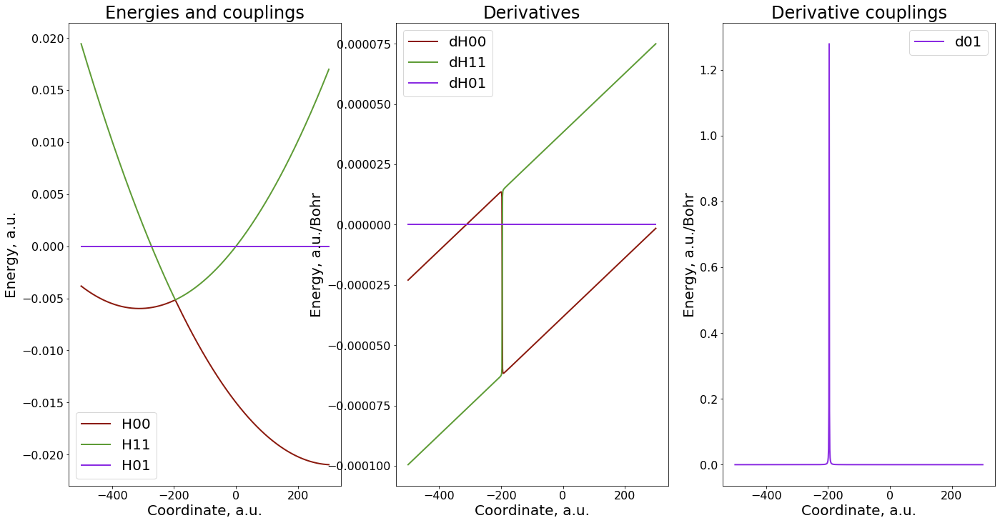

In [9]:
plot_properties(X, compute_model, {"model":2}, {"rep_tdse":1, "rep_ham":1} )

<a name="dynamics"></a>
[Back to TOC](#TOC)

## 4. Dynamics

Before, we run the calculations, we need to initialize our dynmaical variables - both electronic and nuclear. 

The nuclear initial conditions for all the runs below will be identical, so we can set them up here.

In this test, we consider just 25 trajectories: (``ntraj = 25``)

The initial coordinates and momenta of each trajectory will be drawn from the normal distribution with the center values for coordinate to be -300.0 and momenta to be 20.0. This type of initialization is defined by ``"init_type":3`` key-value pair in the ``init_nucl`` variable. The centers of the distributions are given as the values of the two first arguments (lists) to the **init_nuclear_dyn_var** function. Since we work with a 1D problem, each list contains only 1 element (the number of the elements should be equal to the dimensionality of the problem we consider). 

The masses (in a.u.) of nuclear DOFs are given in the 3-rd argument to **init_nuclear_dyn_var** function. 


In [10]:
# Random numbers generator object
rnd = Random()

ntraj = 25

# Initialize nuclear variables
init_nucl = {"init_type":3, "force_constant":[0.001], "ntraj":ntraj}
q, p, iM = compute.init_nuclear_dyn_var([-300.0], [1.0], [100.0], init_nucl, rnd)

Now, lets define the variables governing the dynamics. Most of them coorrespond to the default values (so could have been omitted in this explicit definition). However, it is convenient to have them visible/explicitly defined here.

In [11]:
DR = MATRIX(2,2)
AG = MATRIX(2,2)


dyn_params = { "rep_tdse":1, "rep_ham":0, "rep_sh":1, "rep_lz":0, "tsh_method":3,
               "force_method":1, "nac_update_method":1, "rep_force":1,
               "hop_acceptance_algo":20, "momenta_rescaling_algo":201,
               "use_boltz_factor":0, "Temperature":300.0, "do_reverse":1, "vel_rescale_opt":-1,
               "do_phase_correction":1, "tol":1e-3,
               "state_tracking_algo":2, "MK_alpha":0.0, "MK_verbosity":0, 
               "entanglement_opt":0, "ETHD3_alpha":0.0, "ETHD3_beta":0.0, 
               "decoherence_algo":-1, "decoherence_rates":DR,
               "decoherence_times_type":1, "decoherence_C_param":1.0, 
               "decoherence_eps_param":0.1, "dephasing_informed":0,
               "ave_gaps":AG, "instantaneous_decoherence_variant":1, "collapse_option":0,
               "ensemble":0, "thermostat_params":{},
               "dt":1.0*units.fs2au, "nsteps":500,                
               "mem_output_level":3
              }

Some brief explanation of what they mean:

* ``"rep_tdse": 1`` - the TD-SE will be integrated in the adiabatic representation, meaning the wavefunction is assumed to be represented in the adiabatic basis and in terms of the corresponding (adiabatic rep.) amplitudes

* ``"rep_ham": 0`` - the model Hamiltonian is defined in terms of diabatic properties

* ``"rep_sh":1`` - surface hopping is done in adiabatic representation. This means, for instance, that the hopping probabilities are computed using the amplitudes of the adiabatic basis states and the vibronic Hamiltonian expressed in terms of adiabatic representation

* ``"rep_lz":0`` - not really used in these calculations

* ``"tsh_method":-1`` - how to handle surface hopping, this option (-1) implies no hopping, that is the evolution on the adiabatic PES

* ``"force_method":1`` - how to compute forces acting on the nuclei. This option (1) implies just the adiabatic forces of the active states - as prescribed by the TSH algorithms. Note that if it is used in conjunctions with the "tsh_method":-1, one gets a state-specific adiabatic dynamics.

* ``"nac_update_method":1`` - how to update the NACs used in the calculations of the vibronic Hamiltonians. This option (1) calls for its explicit evaluation using derivative coupling vectors and nuclear momenta. In the NBRA cases, it is set to (0), which means that this property is not re-computed. This re-computation is not really needed since the vibronic Hamiltonians are already passed to the nHamiltonian object via the read files.

* ``"rep_force":1`` - what types of properties are used to compute the nuclear forces. In this case (1), the adiabatic properties (derivative couplings and derivatives of the adiabatic energies) will be used. 

* ``"use_boltz_factor":0`` - scale the hopping probabilities for the transitions up in energy by the Boltzmann factor - this should be used in lieu of velocity rescaling in the non-NBRA version of the NA-MD. **WARNING: At this point, this option is not yet implemented, so we set it to 0 so far** 

* ``"Temperature":300`` - the assumed nuclear temperature (of the bath), used only if  "use_boltz_factor":1

* ``"do_reverse":1`` - instructs the algorithm to reverse the nuclear momenta along the direction of the derivative coupling if the proposed surface hops are not accepted (frustrated hops)

* ``"vel_rescale_opt":-1`` - how to rescale velocities of nuclei after sucessfull hops. The current option (-1) turns of the velocity rescaling at all (which is what you'd do in the NBRA case)

* ``"do_phase_correction":0`` -The option of "1" turns on the correction of the phase factors of adiabatic basis states. This has been shown to give a substantial effect on population transfer dynamics and should be included if possible. This phase correction is not needed if the dynamics is computed in the diabatic basis. 
**For simplicity, in this tutorial, we disregard the phase correction, so do_phase_correction = 0**

* ``"tol":1e-3`` - the minimal value of the time-overlaps <psi_i(t)|psi_j(t+dt)> when the phase correction is applied. If the time-overlap of these functions is smaller this threshold, the phase correction should not really matter, since the NACs will be small anyways, but this helps avoiding divizion by zero when the time-overlap is too small.

* ``"state_tracking_aglo":2`` - this option selects to track the identity of adiabatic states via the Munkres-Kuhn (so-called, mincost) algorithm.
**For simplicity, in this tutorial, we disregard the state tracking, so state_tracking_algo = 0**

* ``"MK_alpha":0.0`` - the parameter that controls the width of the states set which will be included in the state tracking algorithm. This value essentially selects all the states present

* ``"MK_verbosity":0`` - turns off the additional (debug) printing of the mincost algorithm processing

* ``"entanglement_opt":0`` - don't include any quantum nuclei correction on the nuclear dynamics. **WARNINIG: none of them are yet avaialble at the present point**

* ``"ETHD3_alpha"`` and ``"ETHD3_beta"`` - are meaningless at this point, just forget for now

* ``"dt"`` - integration timestep (in a.u. of time) - the same for electronic and nuclear dynamics

* ``"nsteps"`` - how many steps of the dynamics to conduct

* ``"hdf5_output_level"`` - how much of the computed info to store in the created HDF5 file:

   * -1 - don't save any files
   *  0 - just create the file
   *  1 - 1D data, like energies vs. time
   *  2 - 2D data, like the state indices for all trajectories vs. time
   *  3 - 3D data, like populations of all states for all trajectories vs. time
   *  4 - 4D data, like matrix elements of vibronic Hamiltonians for all trajectories vs. time

   Here, we set ``"hdf5_output_level":3`` to compromise between the amount of data saved and the sizes of the files created as well as the speed with which the writing occurs.



These runs are the most "rigorous" type - they follow the Tully's prescription as close as possible, but require all the expensive properties such as excited-states gradients and derivative couplings.

In these calculations, some of the default variables will be redefined as:

* ``"istates":[0.0, 1.0]``, ``"rep":1`` - start in the first excited adiabatic state


* ``"rep_ham":0`` - model in diabatic representation
* ``"force_method":1`` - TSH forces
* ``"rep_force":1`` - compute forces via adiabatic properties
* ``"rep_tsde":1`` - solve TD-SE via propagating adiabatic amplitudes
* ``"nac_update_method":1`` - NACs via derivative couplings and nuclear momenta
* ``"tsh_method":0`` - FSSH
* ``"vel_rescale_opt":0`` - rescale velocities according to derivative coupling vector

In addition, for each run we set:

* ``"prefix"`` - setup according to run, to be the name of the HDF5 to be created


Note that in all following calls we pass only a copy of the ``dyn_params`` dictionary

``_dyn_params = dict(dyn_params)``

This way, we don't accidentally re-use the control variables from a previous run, and we can use the *update()* function to modify the copies of the original ``dyn_params`` variable as needed.

<a name="fssh"></a>
[Back to TOC](#TOC)


### 4.1.   FSSH


* ``"states":[0.0, 1.0]``, ``"rep":1`` - initialize all the trajectories on the first excited adiabatic state
* ``"tsh_method":0`` - do the surface hopping via FSSH
* ``"vel_rescale_opt":0`` - do the velocity rescaling along derivative couplings

In [12]:
_init_elec = { "init_type":3, "nstates":2, "istates":[0.0, 1.0], "rep":1,  "ntraj":ntraj   }

_dyn_params = dict(dyn_params)    
_dyn_params.update({"rep_ham":0, "force_method":1, "rep_force":1, "rep_tdse":1, 
                    "nac_update_method":1, "tsh_method":0, "vel_rescale_opt":0})
_dyn_params.update({"prefix":"T5-1"})
    
_model_params = {"model":1, "model0":1}    
res = compute.generic_recipe(q, p, iM, _dyn_params, compute_model, _model_params, _init_elec, rnd)

 step= 0
 step= 50
 step= 100
 step= 150
 step= 200
 step= 250
 step= 300
 step= 350
 step= 400
 step= 450
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keywords =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named Ekin_ave/data
Saving the dataset named Epot_ave/data
Saving the dataset named Etot_ave/data
Saving the dataset named dEki

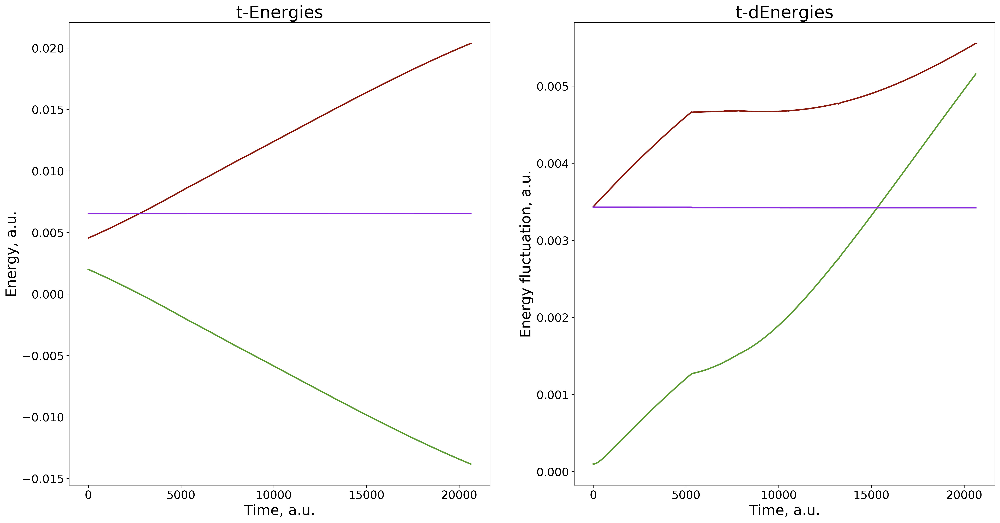

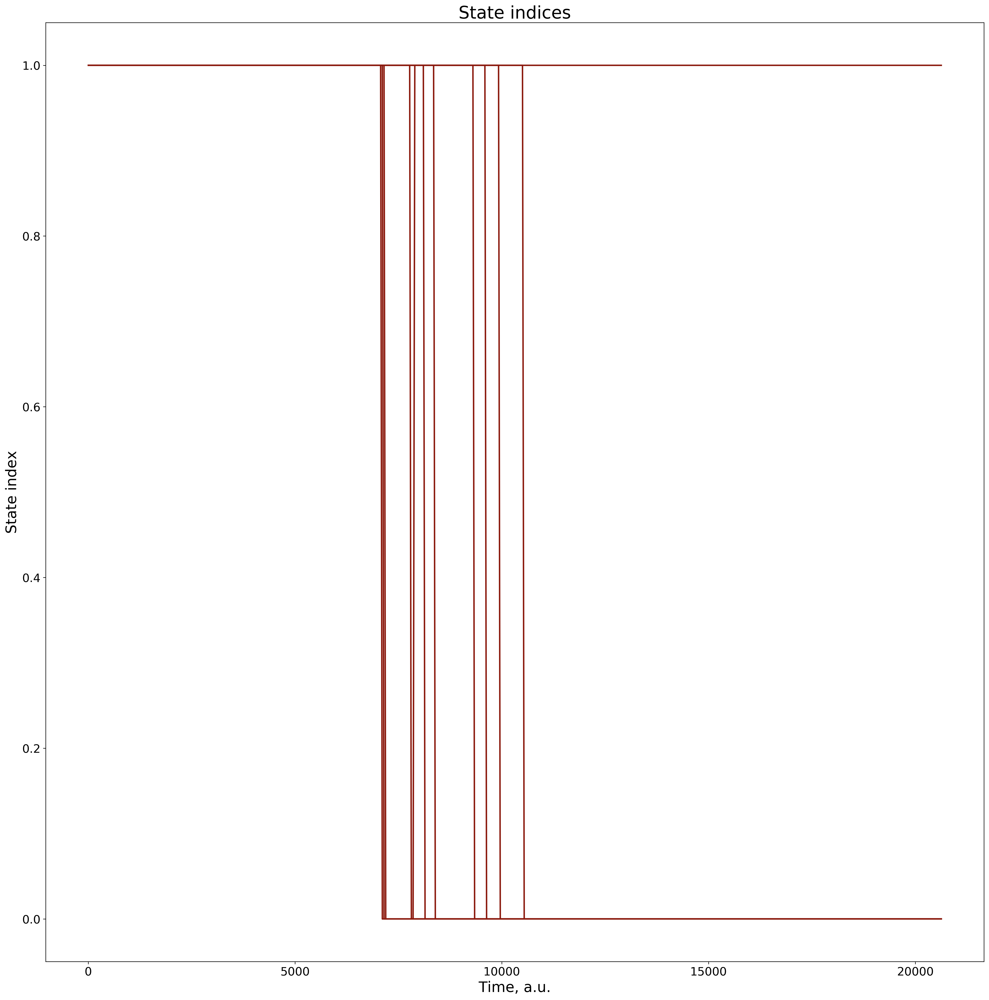

/home/alexey/miniconda2/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


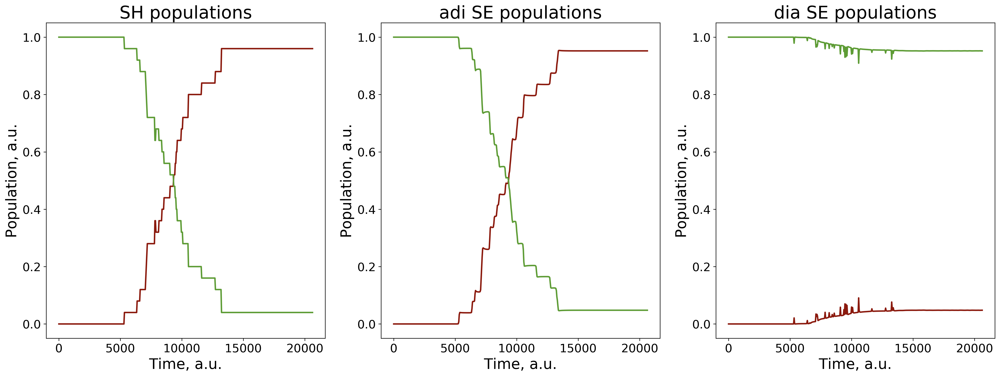

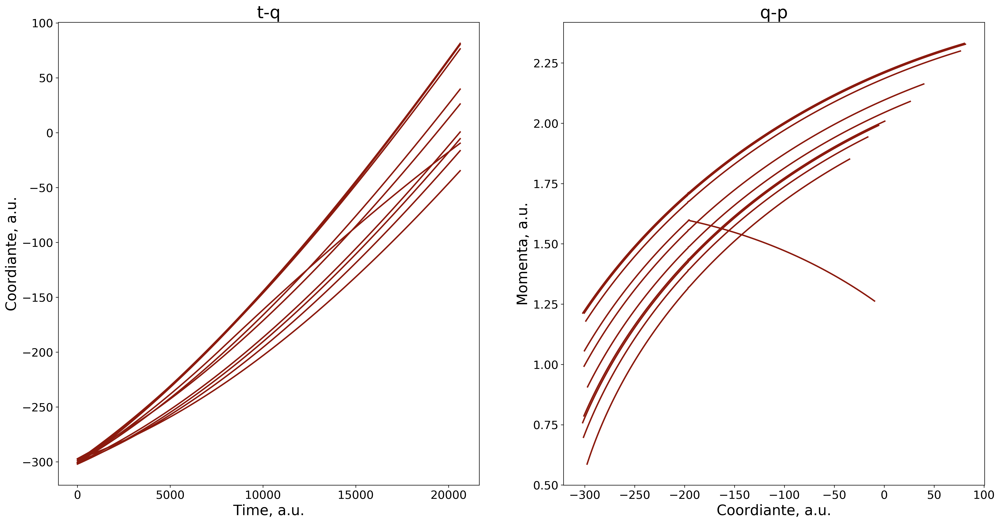

In [13]:
plot_prms = { "prefix":"T5-1", "filename":"mem_data.hdf", "output_level":3,
              "which_trajectories":range(10), "which_dofs":[0],
              "which_adi_states":[0, 1], "which_dia_states":[0, 1]              
            }

dynamics_plotting.plot_dyn(plot_prms)

<a name="dish-1"></a>
[Back to TOC](#TOC)


### 4.2.  DISH with user-defined decoherence rates


* ``"states":[0.0, 1.0]``, ``"rep":1`` - initialize all the trajectories on the first excited adiabatic state
* ``"tsh_method":3`` - do the surface hopping via DISH
* ``"vel_rescale_opt":0`` - do the velocity rescaling along derivative couplings
* ``"decoherence_algo":-1`` - no additional decoherence corrections
* ``"decoherence_times_type":0`` - dephasing times are provided by user - same for all trajectories
* ``"decoh_rates":DM`` - a manual definition of the decoherence rates

In [14]:
_init_elec = { "init_type":3, "nstates":2, "istates":[0.0, 1.0], "rep":1,  "ntraj":ntraj   }

_dyn_params = dict(dyn_params)    
_dyn_params.update({"rep_ham":0, "force_method":1, "rep_force":1, "rep_tdse":1, 
                    "nac_update_method":1, "tsh_method":3, "vel_rescale_opt":0})
_dyn_params.update({"prefix":"T5-2.1"})

DR = MATRIX(2,2)
DR.set(0, 1, 0.1)
DR.set(1, 0, 0.1)
_dyn_params.update({"decoherence_algo":-1, "decoherence_times_type":0, "decoh_rates":DR })

_model_params = {"model":1, "model0":1}    
res = compute.generic_recipe(q, p, iM, _dyn_params, compute_model, _model_params, _init_elec, rnd)

 step= 0
 step= 50
 step= 100
 step= 150
 step= 200
 step= 250
 step= 300
 step= 350
 step= 400
 step= 450
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keywords =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named Ekin_ave/data
Saving the dataset named Epot_ave/data
Saving the dataset named Etot_ave/data
Saving the dataset named dEki

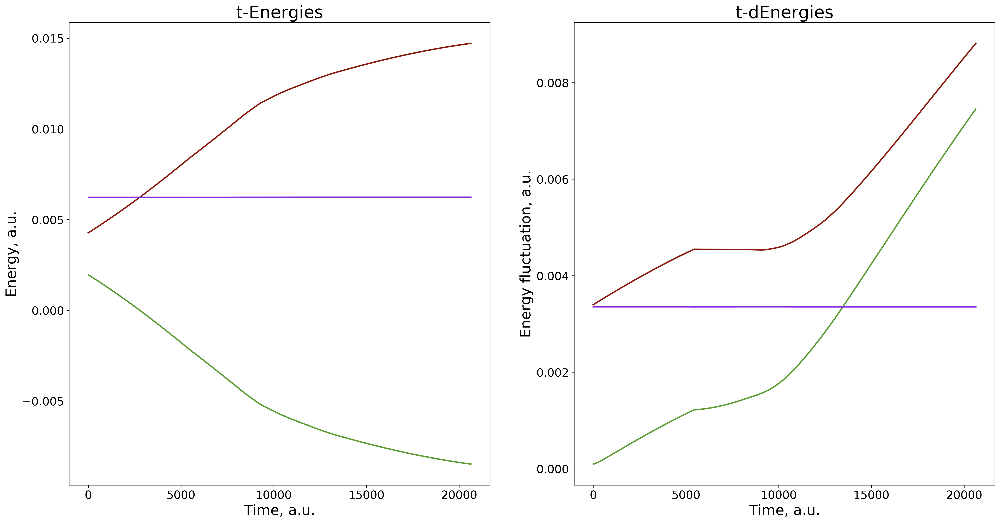

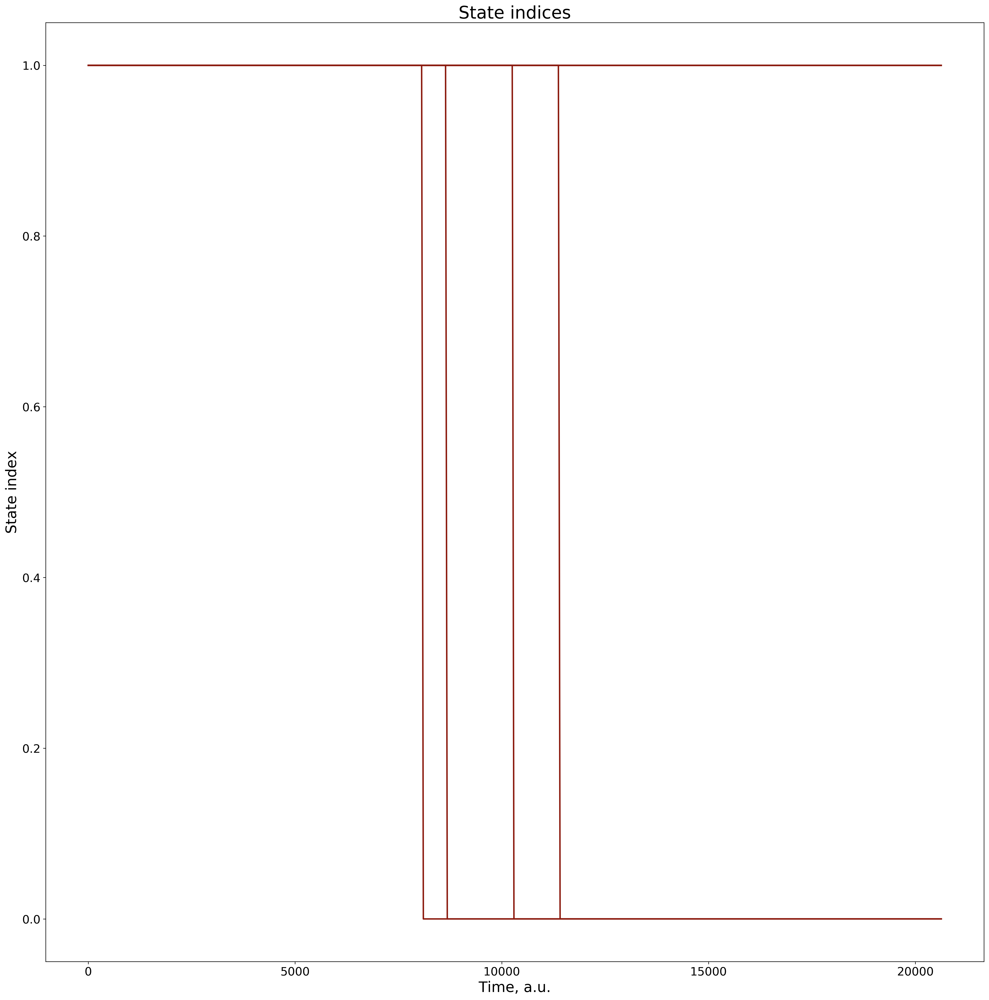

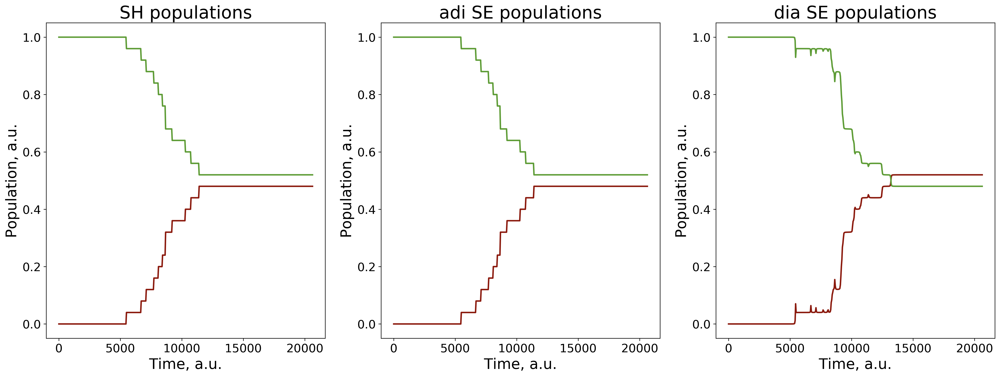

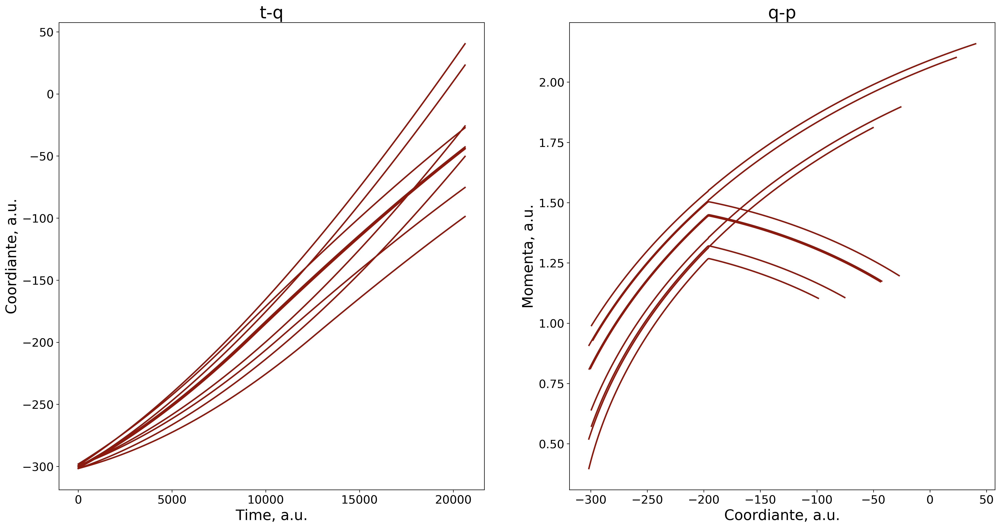

In [15]:
plot_prms = { "prefix":"T5-2.1", "filename":"data.hdf", "output_level":3,
              "which_trajectories":range(10), "which_dofs":[0],
              "which_adi_states":[0, 1], "which_dia_states":[0, 1]              
            }

dynamics_plotting.plot_dyn(plot_prms)

Try the same thing as above, except that the collapse is done differently - not keeping the phase information, but rather resetting the amplitudes to 1.0+0.0j

In [16]:
_init_elec = { "init_type":3, "nstates":2, "istates":[0.0, 1.0], "rep":1,  "ntraj":ntraj   }

_dyn_params = dict(dyn_params)    
_dyn_params.update({"rep_ham":0, "force_method":1, "rep_force":1, "rep_tdse":1, 
                    "nac_update_method":1, "tsh_method":3, "vel_rescale_opt":0})
_dyn_params.update({"prefix":"T5-2.2"})

DR = MATRIX(2,2)
DR.set(0, 1, 0.1)
DR.set(1, 0, 0.1)
_dyn_params.update({"decoherence_algo":-1, "decoherence_times_type":0, "decoh_rates":DR, "collapse_option":1 })

_model_params = {"model":1, "model0":1}    
res = compute.generic_recipe(q, p, iM, _dyn_params, compute_model, _model_params, _init_elec, rnd)

 step= 0
 step= 50
 step= 100
 step= 150
 step= 200
 step= 250
 step= 300
 step= 350
 step= 400
 step= 450
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keywords =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named Ekin_ave/data
Saving the dataset named Epot_ave/data
Saving the dataset named Etot_ave/data
Saving the dataset named dEki

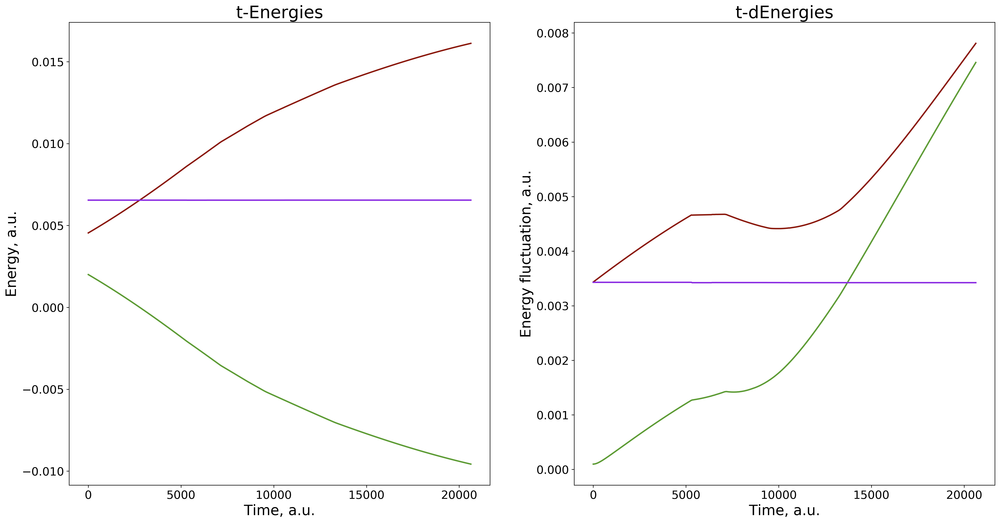

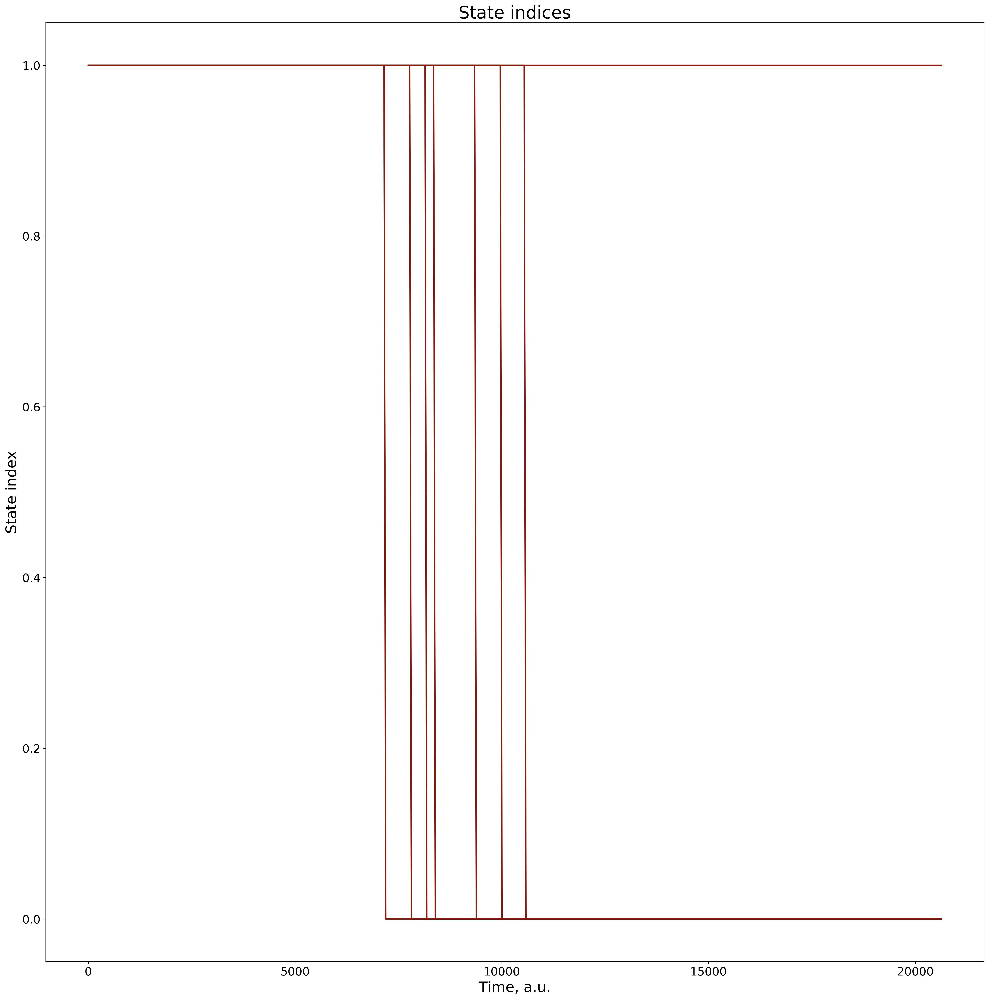

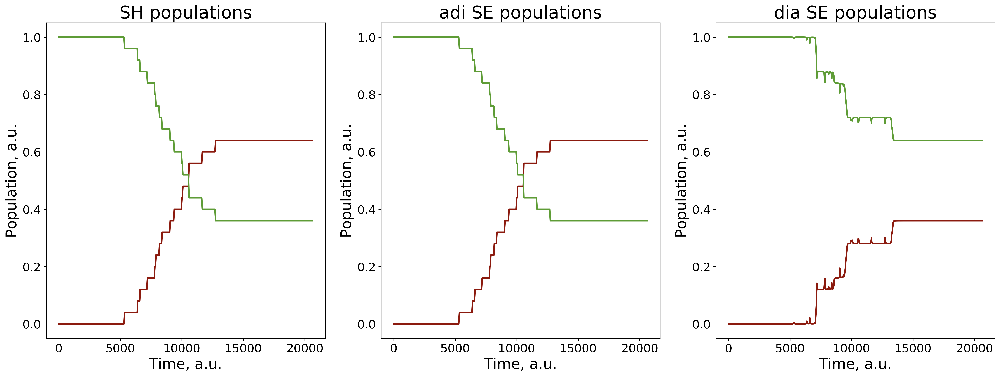

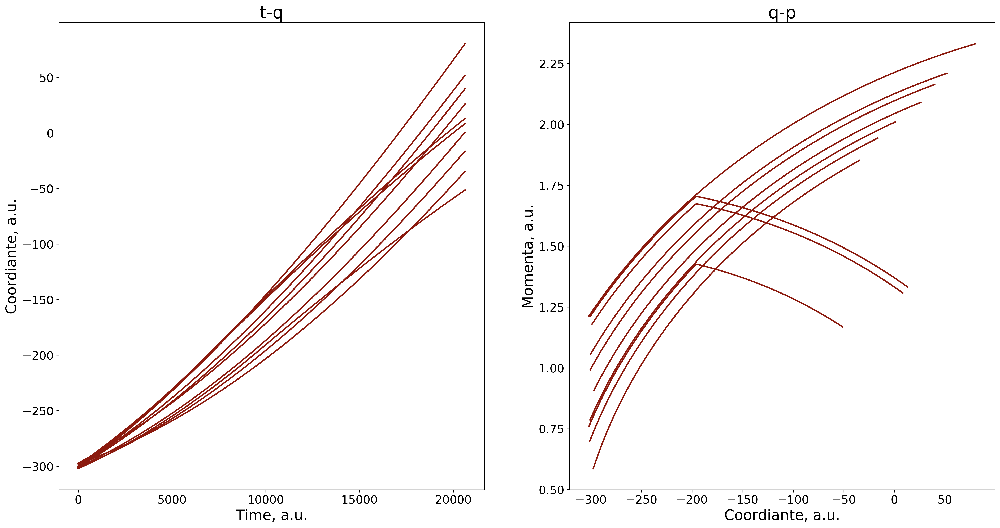

In [17]:
plot_prms = { "prefix":"T5-2.2", "filename":"mem_data.hdf", "output_level":3,
              "which_trajectories":range(10), "which_dofs":[0],
              "which_adi_states":[0, 1], "which_dia_states":[0, 1]              
            }

dynamics_plotting.plot_dyn(plot_prms)

<a name="dish-2"></a>
[Back to TOC](#TOC)


### 4.3. DISH with energy-based decoherence, EDC, of Granucci & Persico

* ``"states":[0.0, 1.0]``, ``"rep":1`` - initialize all the trajectories on the first excited adiabatic state
* ``"tsh_method":3`` - do the surface hopping via DISH
* ``"vel_rescale_opt":0`` - do the velocity rescaling along derivative couplings
* ``"decoherence_algo":-1`` - no additional decoherence corrections
* ``"decoherence_times_type":1`` - compute dephasing times according to the energy-based decoherence scheme
* ``"decoherence_C_param":1.0`` - the standard parameter for EDC
* ``"decoherence_eps_param":0.1`` - another standard parameter for EDC


In [18]:
_init_elec = { "init_type":3, "nstates":2, "istates":[0.0, 1.0], "rep":1,  "ntraj":ntraj   }

_dyn_params = dict(dyn_params)    
_dyn_params.update({"rep_ham":0, "force_method":1, "rep_force":1, "rep_tdse":1, 
                    "nac_update_method":1, "tsh_method":3, "vel_rescale_opt":0})
_dyn_params.update({"prefix":"T5-3"})

DR = MATRIX(2,2)
DR.set(0, 1, 1.0)
DR.set(1, 0, 1.0)
_dyn_params.update({"decoherence_algo":-1,
                    "decoherence_times_type":1, "decoherence_C_param":1.0, "decoherence_eps_param":0.1
                   })

_model_params = {"model":1, "model0":1}    
res = compute.generic_recipe(q, p, iM, _dyn_params, compute_model, _model_params, _init_elec, rnd)
#plot_dyn(res)

 step= 0
 step= 50
 step= 100
 step= 150
 step= 200
 step= 250
 step= 300
 step= 350
 step= 400
 step= 450
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keywords =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named Ekin_ave/data
Saving the dataset named Epot_ave/data
Saving the dataset named Etot_ave/data
Saving the dataset named dEki

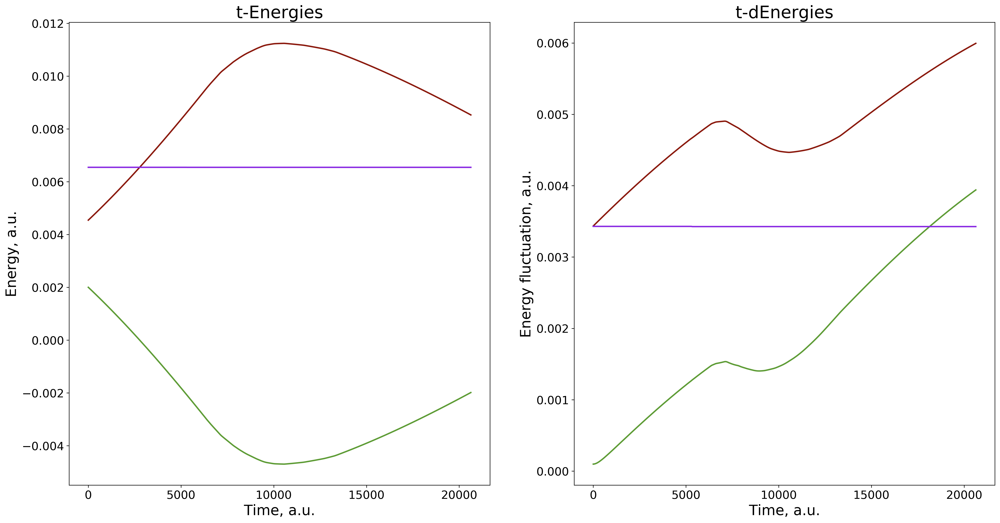

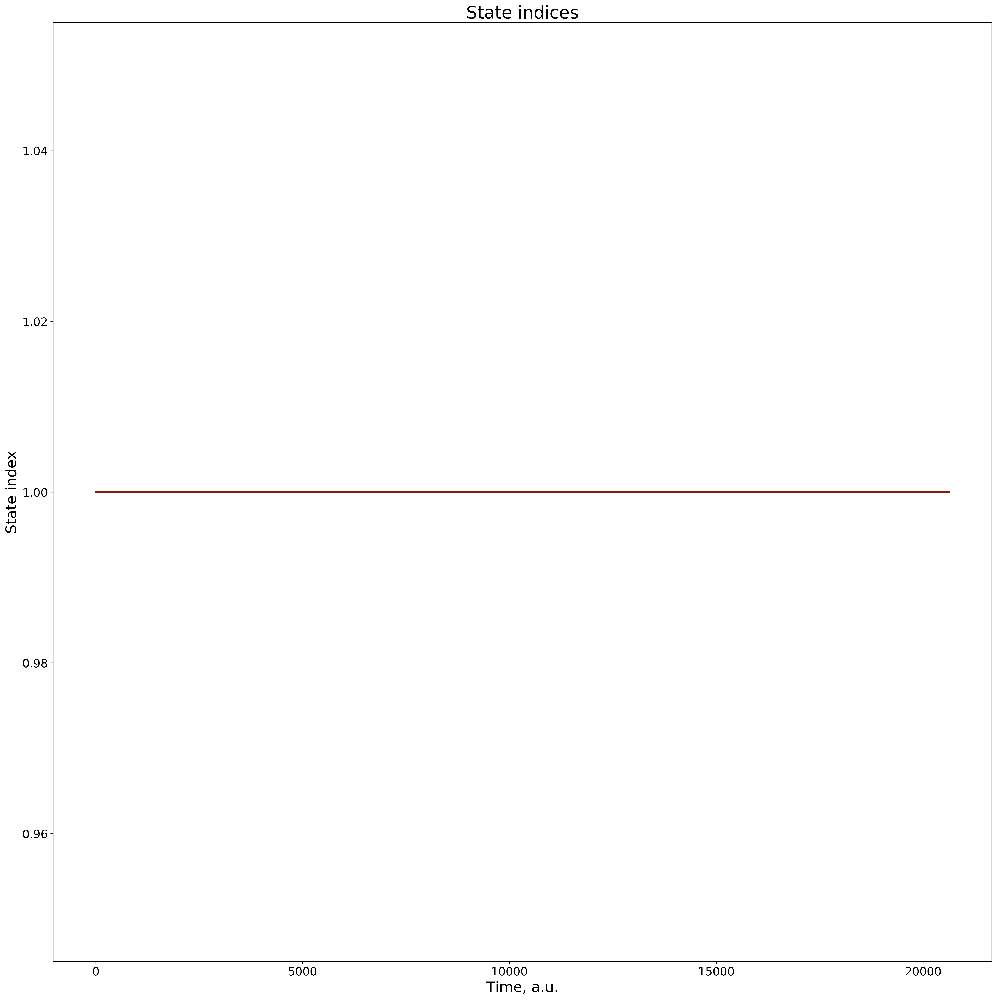

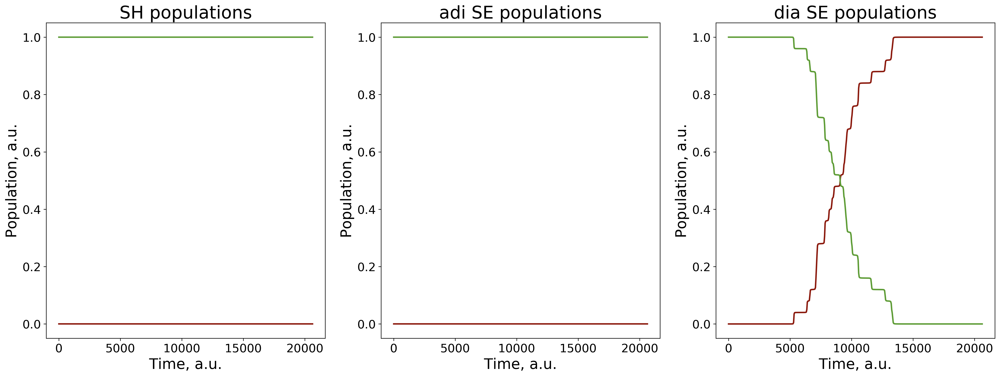

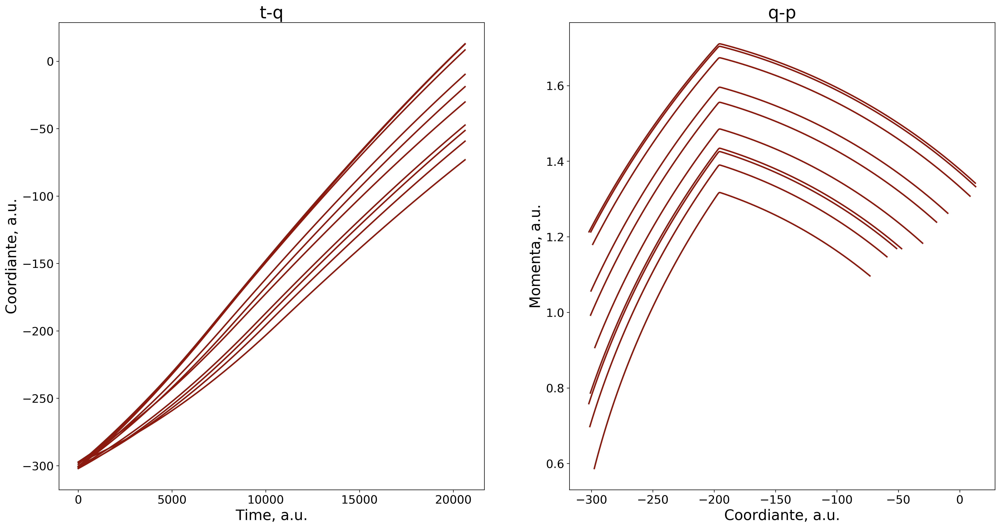

In [19]:
plot_prms = { "prefix":"T5-3", "filename":"mem_data.hdf", "output_level":3,
              "which_trajectories":range(10), "which_dofs":[0],
              "which_adi_states":[0, 1], "which_dia_states":[0, 1]              
            }

dynamics_plotting.plot_dyn(plot_prms)

<a name="msdm"></a>
[Back to TOC](#TOC)


### 4.4. mSDM with manual decoherence rates



In [20]:
_init_elec = { "init_type":3, "nstates":2, "istates":[0.0, 1.0], "rep":1,  "ntraj":ntraj   }

_dyn_params = dict(dyn_params)    
_dyn_params.update({"rep_ham":0, "force_method":1, "rep_force":1, "rep_tdse":1, 
                    "nac_update_method":1, "tsh_method":0, "vel_rescale_opt":0})
_dyn_params.update({"prefix":"T5-4"})

DR = MATRIX(2,2)
DR.set(0, 1, 0.1)
DR.set(1, 0, 0.1)
_dyn_params.update({"decoherence_algo":0, "decoherence_times_type":0, "decoh_rates":DR })

_model_params = {"model":1, "model0":1}    
res = compute.generic_recipe(q, p, iM, _dyn_params, compute_model, _model_params, _init_elec, rnd)

 step= 0
 step= 50
 step= 100
 step= 150
 step= 200
 step= 250
 step= 300
 step= 350
 step= 400
 step= 450
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keywords =  ['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'states', 'SH_pop', 'D_adi', 'D_dia', 'q', 'p', 'Cadi', 'Cdia'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named Ekin_ave/data
Saving the dataset named Epot_ave/data
Saving the dataset named Etot_ave/data
Saving the dataset named dEki

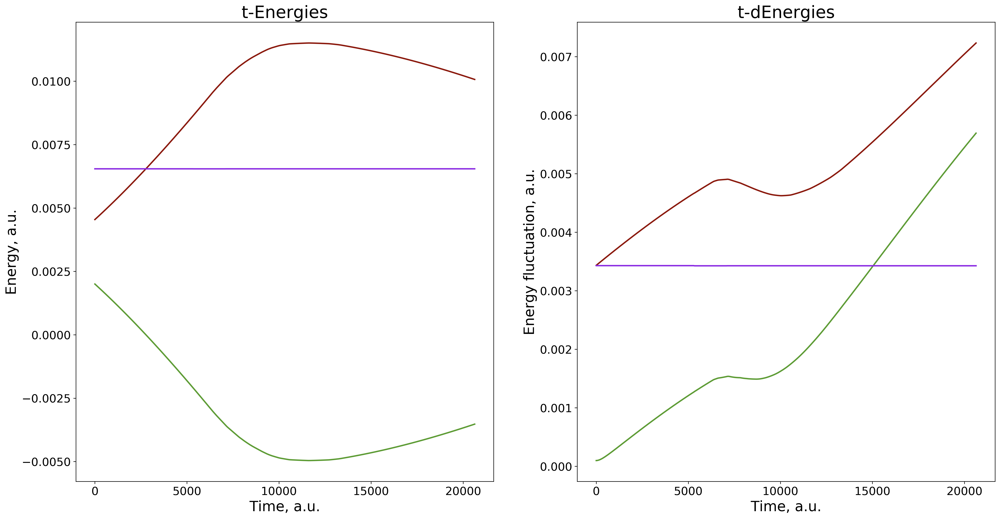

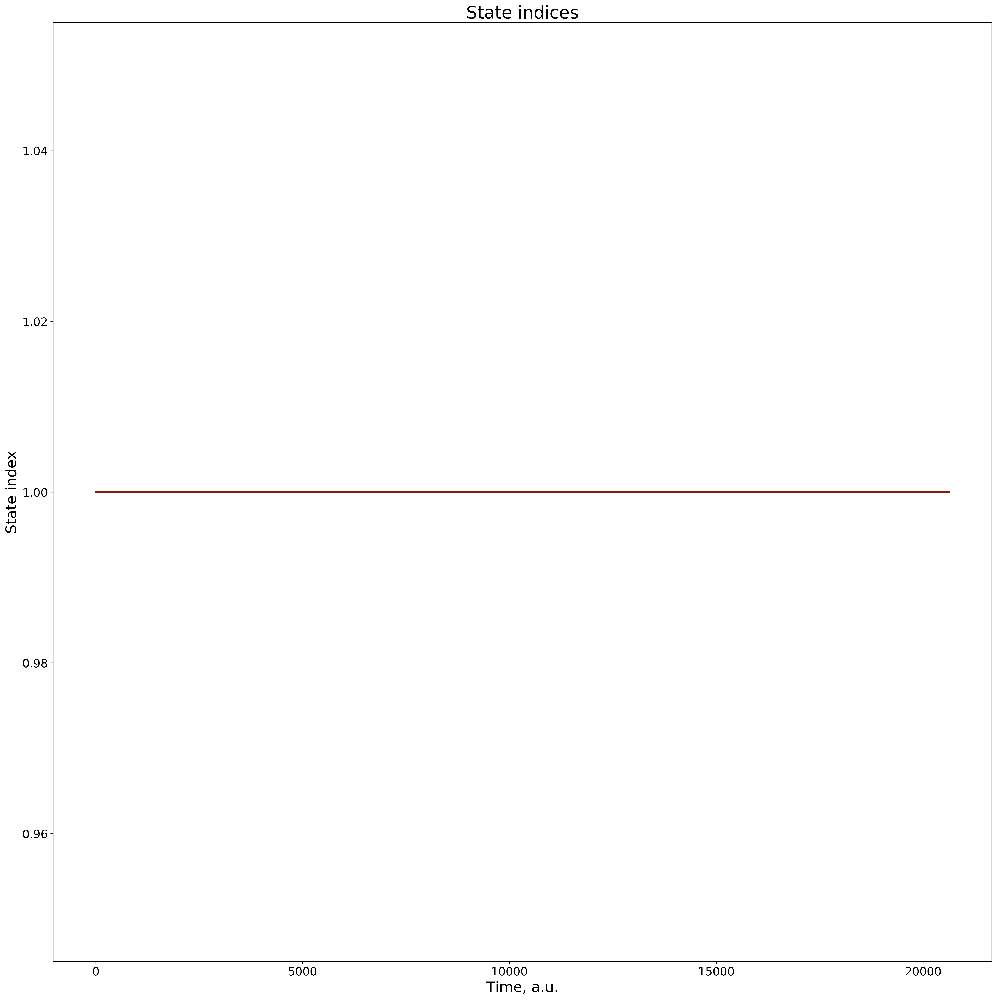

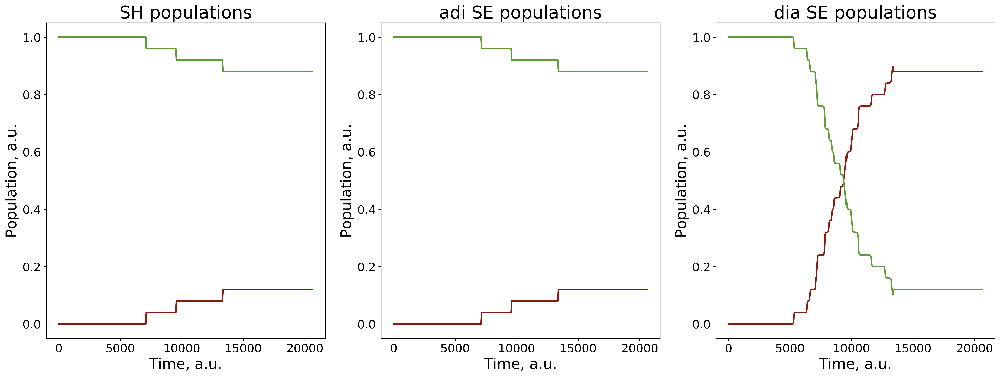

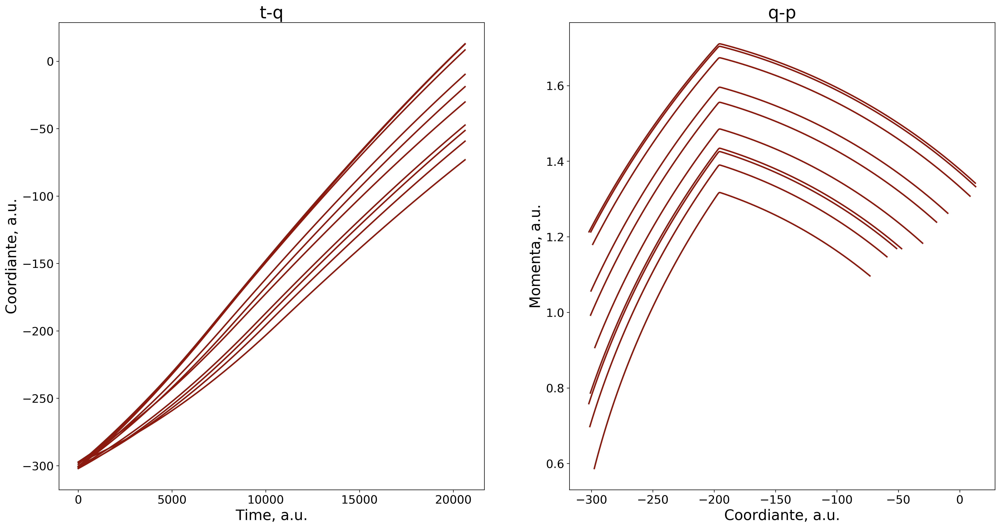

In [21]:
plot_prms = { "prefix":"T5-4", "filename":"mem_data.hdf", "output_level":3,
              "which_trajectories":range(10), "which_dofs":[0],
              "which_adi_states":[0, 1], "which_dia_states":[0, 1]              
            }

dynamics_plotting.plot_dyn(plot_prms)